In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from wrangle import wrangle_da

In [2]:
from formating import percent, Percent, bold, col_cap, strike, underline

In [3]:
df = wrangle_da()

In [4]:
df

,court_number,arrest_date,arresting_agency,crime_type,booked_case_type,dv_case,da_action_taken,year,month,weekend
0,11002204,2011-01-21,SFPD,Willful Homicide,Felony,No,Discharged,2011,1,0
1,11008968,2011-03-31,SFPD,Willful Homicide,Felony,No,Discharged,2011,3,0
2,11008679,2011-03-28,SFPD,Willful Homicide,Felony,No,Discharged,2011,3,0
3,2460003,2011-05-25,SFPD,Willful Homicide,Felony,No,Discharged,2011,5,0
4,11018969,2011-07-15,SFPD,Willful Homicide,Felony,No,Discharged,2011,7,0
...,...,...,...,...,...,...,...,...,...,...
135448,22009862,2022-08-31,SFPD,NA (Att.),Felony,No,Charges Filed,2022,8,0
135449,13019620,2013-07-15,SFPD,NA (Att.),Felony,No,Charges Filed,2013,7,0
135450,14015903,2014-06-15,SFPD,NA (Att.),Felony,No,Charges Filed,2014,6,1
135451,20006299,2020-05-30,SFPD,NA (Att.),Felony,No,Charges Filed,2020,5,1


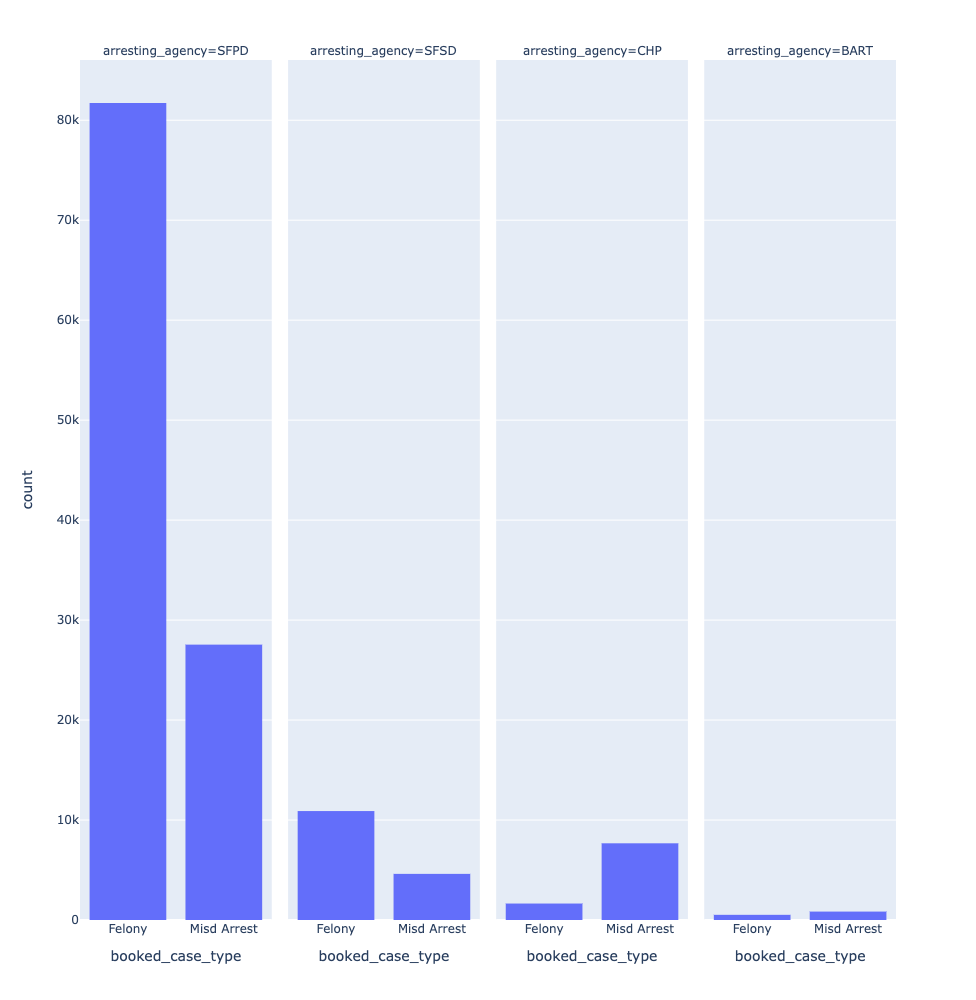

In [5]:
px.histogram(data_frame=df, 
             x= 'booked_case_type',
             facet_col= 'arresting_agency',
             facet_col_wrap=5,
             # facet_col_spacing=.1,
             height=1000,
             # barnorm='fraction'
             # log_y=True
            )

In [6]:
for i in df.arresting_agency.unique():
    case_type_counts = df.booked_case_type[df.arresting_agency == i].value_counts(sort=False)
    tot_case = case_type_counts[0] + case_type_counts[1]
    fel_per = case_type_counts[0] / tot_case
    misd_per = case_type_counts[1] / tot_case
    print(f"{i}:\n\n {case_type_counts}\n\nFelony Percentage: {percent(fel_per)}\
\nMisdemeanor Percenrage: {percent(misd_per)}\n\n\n")

SFPD:

 Felony         81721
Misd Arrest    27544
Name: booked_case_type, dtype: int64

Felony Percentage: 74.79%
Misdemeanor Percenrage: 25.21%



SFSD:

 Felony         10897
Misd Arrest     4614
Name: booked_case_type, dtype: int64

Felony Percentage: 70.25%
Misdemeanor Percenrage: 29.75%



CHP:

 Felony         1646
Misd Arrest    7672
Name: booked_case_type, dtype: int64

Felony Percentage: 17.66%
Misdemeanor Percenrage: 82.34%



BART:

 Felony         517
Misd Arrest    842
Name: booked_case_type, dtype: int64

Felony Percentage: 38.04%
Misdemeanor Percenrage: 61.96%





In [7]:
df.arresting_agency.value_counts()

SFPD    109265
SFSD     15511
CHP       9318
BART      1359
Name: arresting_agency, dtype: int64

## Felony/Misdemeanor Arrest Rates by Agency

|Agency|Total Arrests|Felony | Misdemeanor |
|---|---|---|---|
|SF Police D.| 109k| 75%| 25%|
|SF Sherrif Dept| 15.5k|70%| 30%|
|Cali. Highway Patrol| 9k |18% | 82%|
|Bay Area Rapid Trainsit| 1k | 38%| 62%|
<br><br>
- **It looks like the reported data shows The Police and Sherriff's Departments mostly deal with Felony Arrests**
- **While the Highway Patrol is almost entirely Misdemeanors**
- **And the Bay Area Rapid Transit has the closest to even percentages of Felony and Misdemeanor**
  - **With the exception that they only have 1359 total arrests in over 10 years**

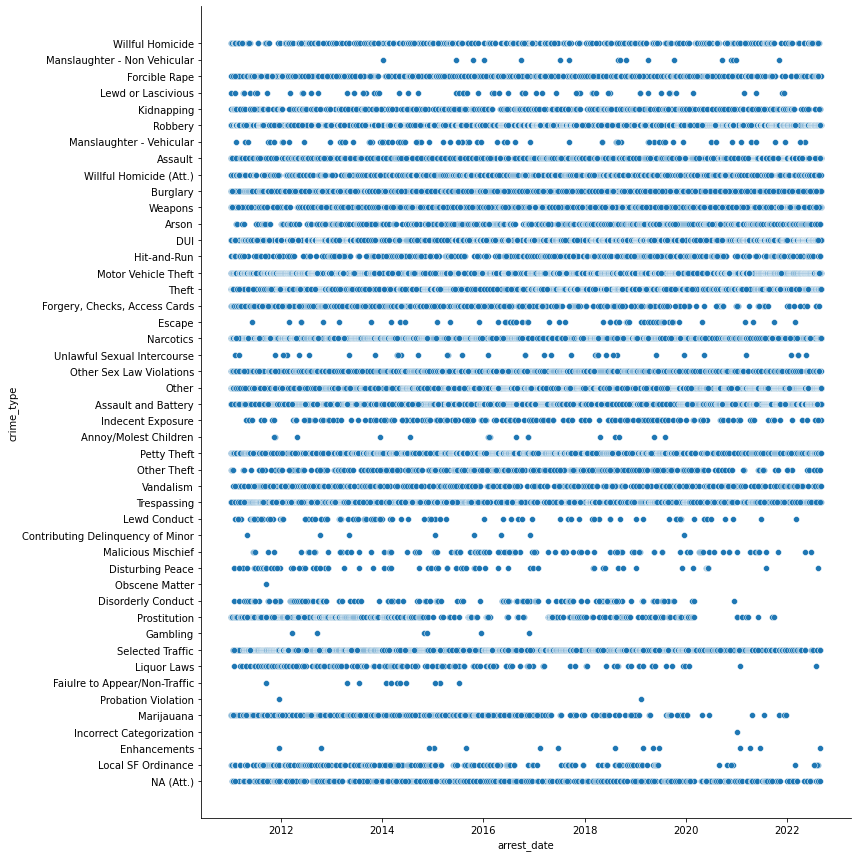

In [8]:
sns.relplot(data=df,
            x= 'arrest_date',
            y= 'crime_type',
            height= 12
           )

plt.show()


### Observations

- **Failure to Appear/Non-Traffic seems to drop off completely by 2016**
- **There only seems to be 1 'Incorrect Categorization'**
  - **probably drop that**
  
- **

In [9]:
df.crime_type.value_counts()

Assault                              25797
Narcotics                            18981
Other                                14000
Burglary                             13300
DUI                                  11824
Assault and Battery                  11152
Theft                                 7375
Robbery                               6892
Weapons                               5559
Motor Vehicle Theft                   5360
Petty Theft                           2041
Trespassing                           1740
Selected Traffic                      1414
Marijauana                            1403
Other Sex Law Violations              1021
Prostitution                           796
Willful Homicide (Att.)                733
Forgery, Checks, Access Cards          624
Forcible Rape                          615
Arson                                  592
Kidnapping                             560
NA (Att.)                              488
Willful Homicide                       456
Hit-and-Run

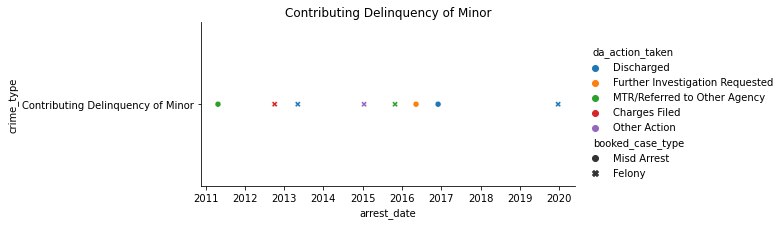

In [10]:
crime = 'Contributing Delinquency of Minor'

sns.relplot(data=df[df.crime_type == crime],
            x= 'arrest_date',
            y= 'crime_type',
            style= 'booked_case_type',
            hue= 'da_action_taken',
            height= 3,
            aspect= 3
           )
plt.title(f'{crime}')

plt.show()


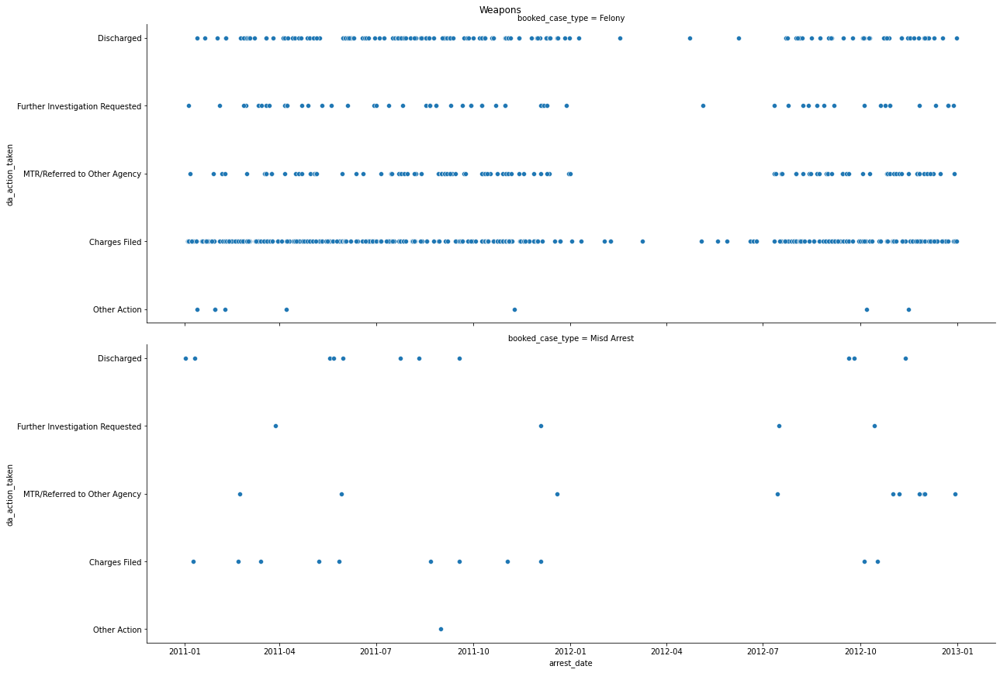

In [11]:
crime = 'Weapons'
date_range = ['2011' , '2013']

sns.relplot(data=df[(df.crime_type == crime) & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
            x= 'arrest_date',
            y= 'da_action_taken',
            row= 'booked_case_type',
            # row= 'da_action_taken',
            height= 6,
            aspect= 3
           )
plt.suptitle(f'{crime}', y=1)

plt.show()


- **There seemed to be a drop in Weapon arrests during the first half of 2012... I wonder why**

In [12]:
# df.da_action_taken = df.da_action_taken.astype('category')

# df.da_action_taken = df.da_action_taken.cat.set_categories(['Discharged', 'Further Investigation Requested',
#        'MTR/Referred to Other Agency', 'Charges Filed', 'Other Action'])

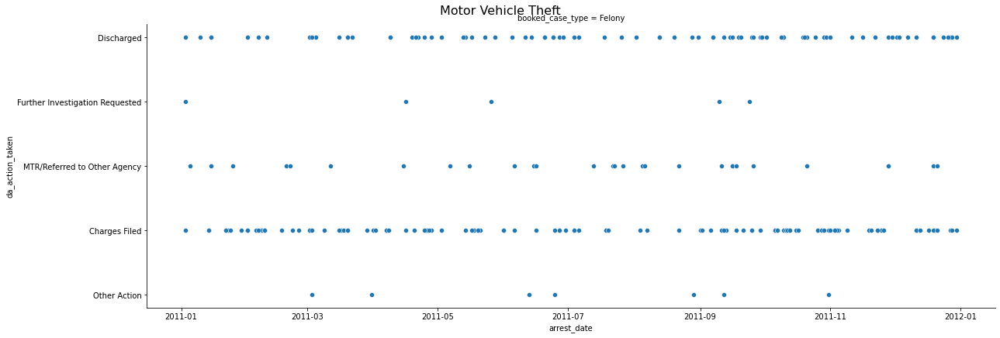

In [13]:
crime = 'Motor Vehicle Theft'
# date_range = ['2011' , '2013']
year = 2011

sns.relplot(data=df[(df.crime_type == crime) & (df.year == year)],# & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
            x= 'arrest_date',
            y= 'da_action_taken',
            # col= 'year',
            # col_wrap=1,
            row= 'booked_case_type',
            # row= 'da_action_taken',
            height= 6,
            aspect= 3
           )
plt.suptitle(f'{crime}', y=1, fontsize=16)

plt.show()


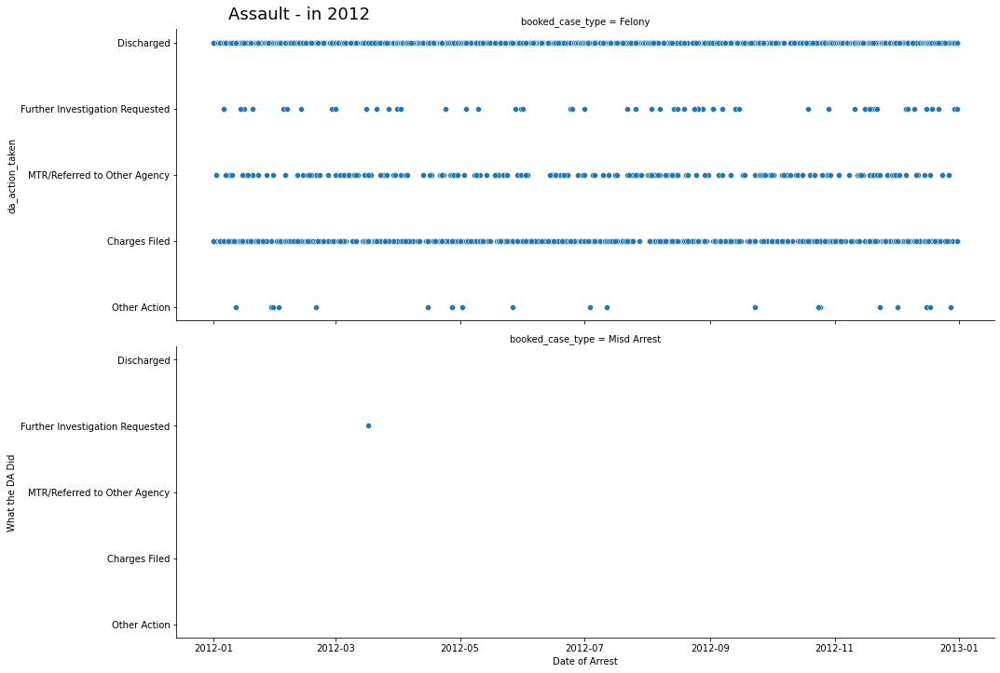

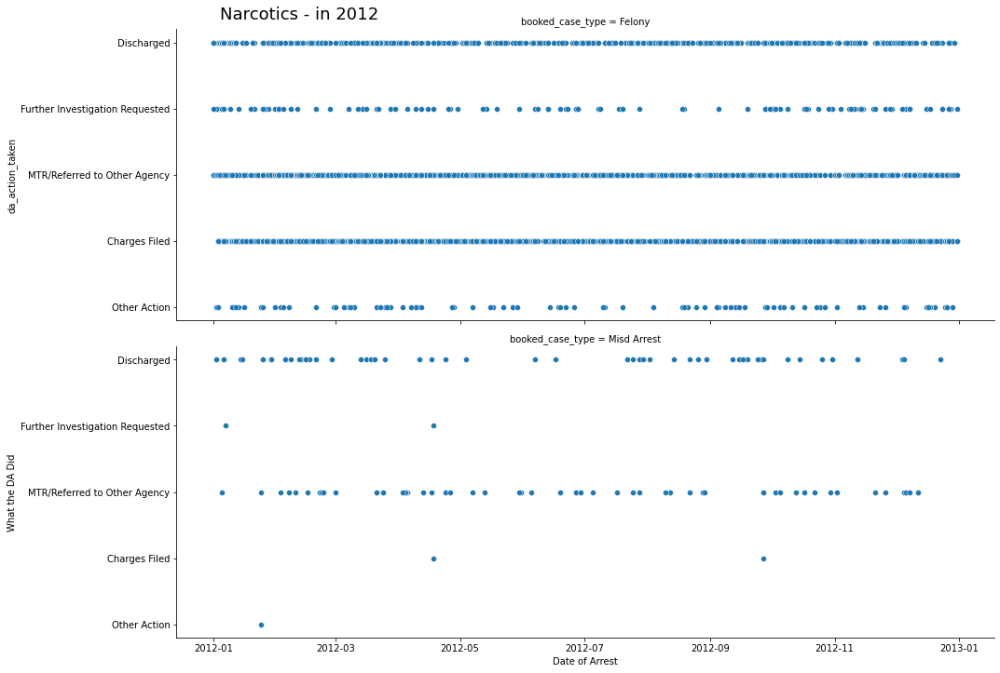

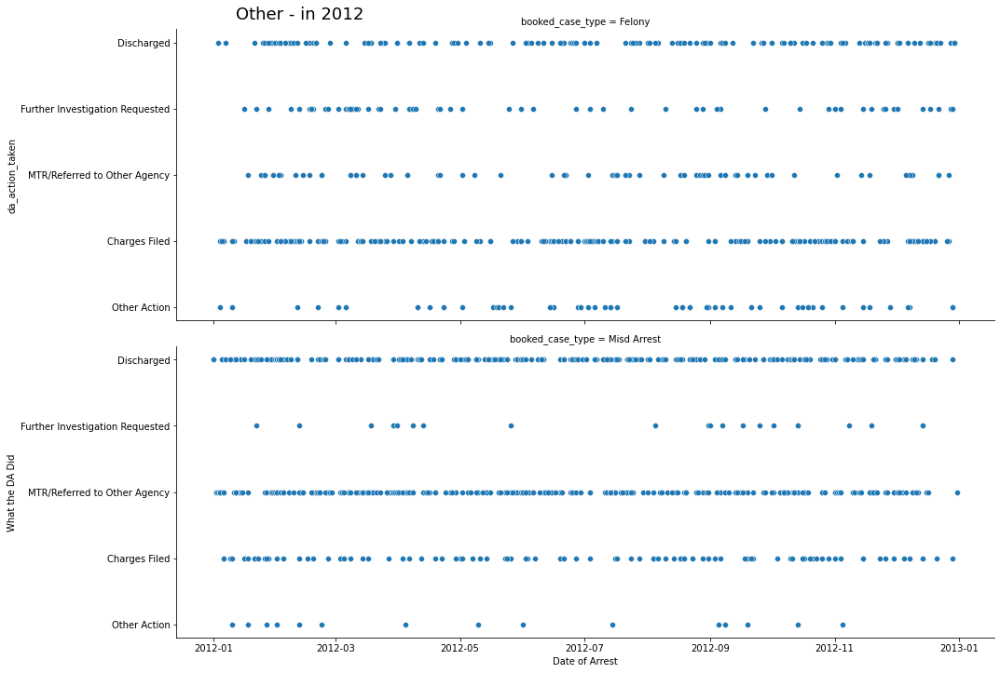

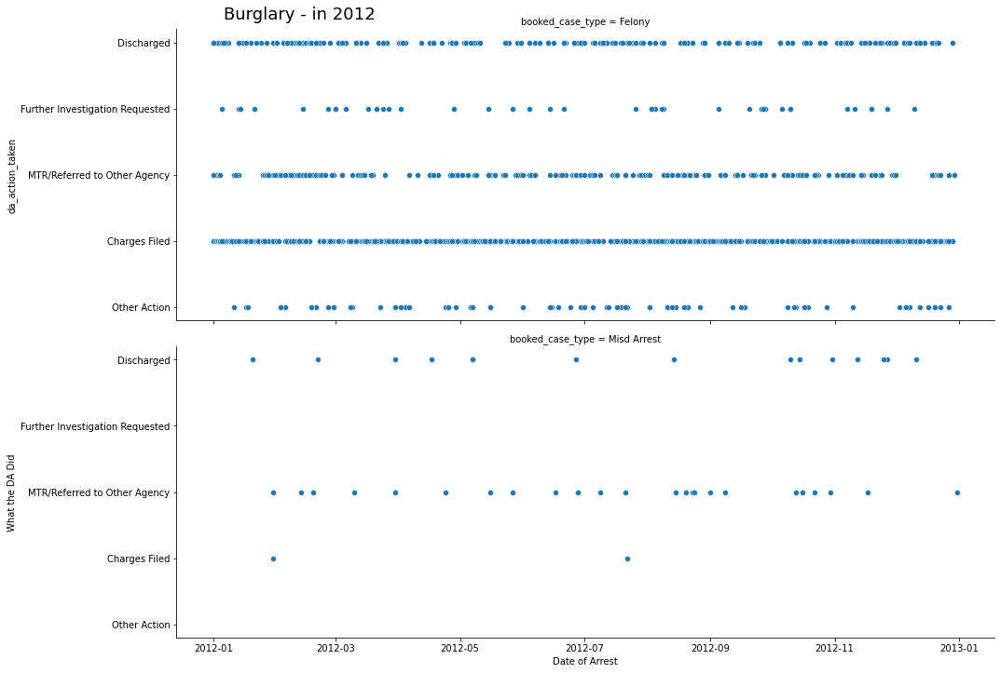

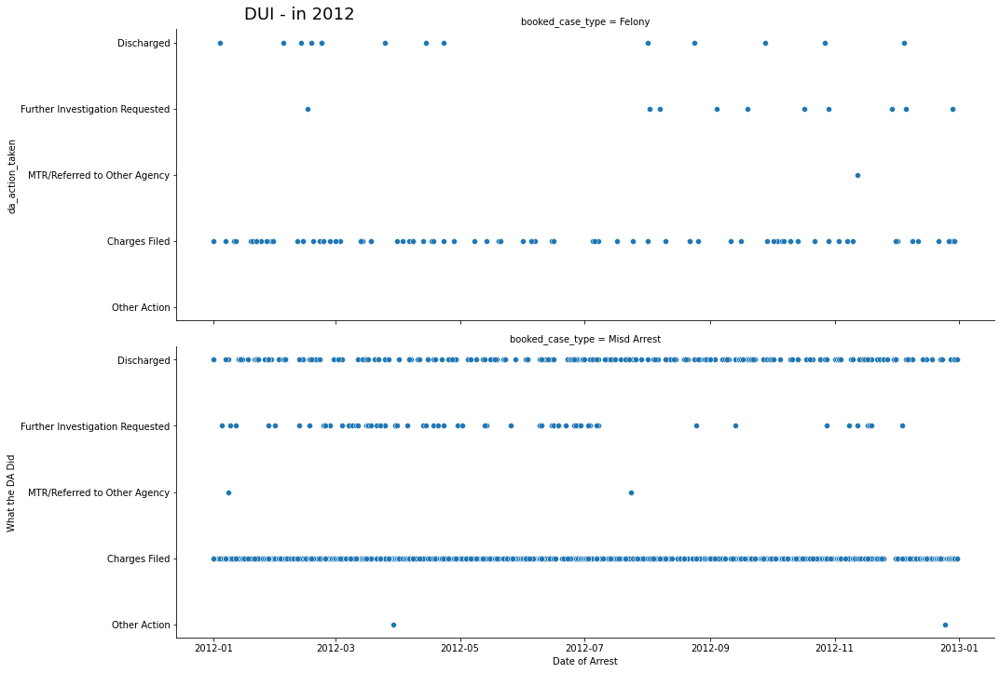

...

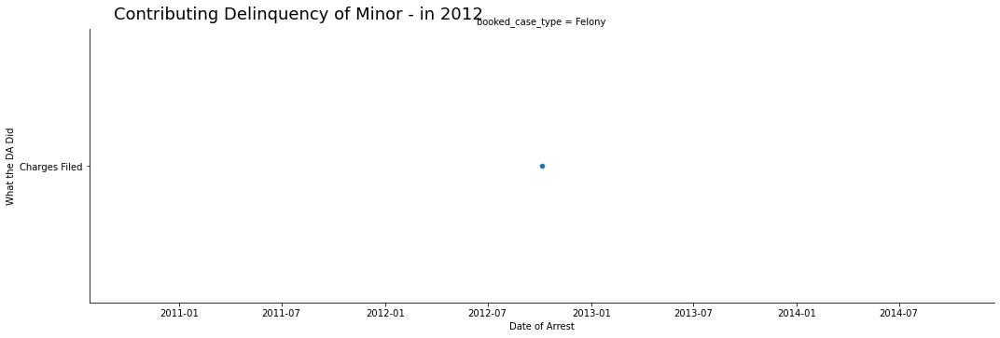

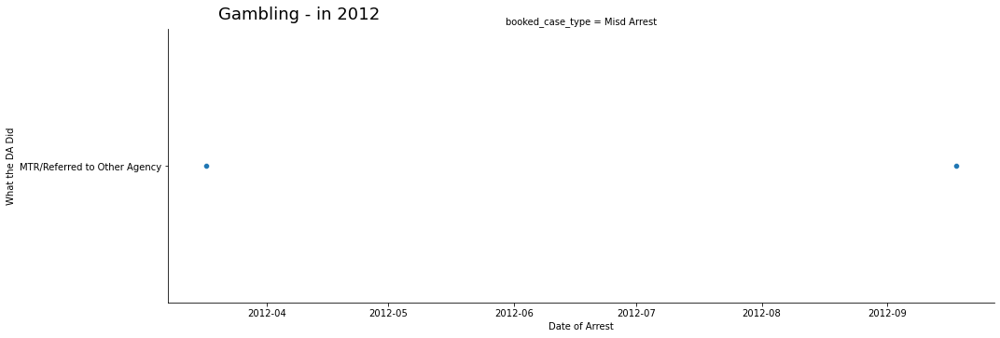

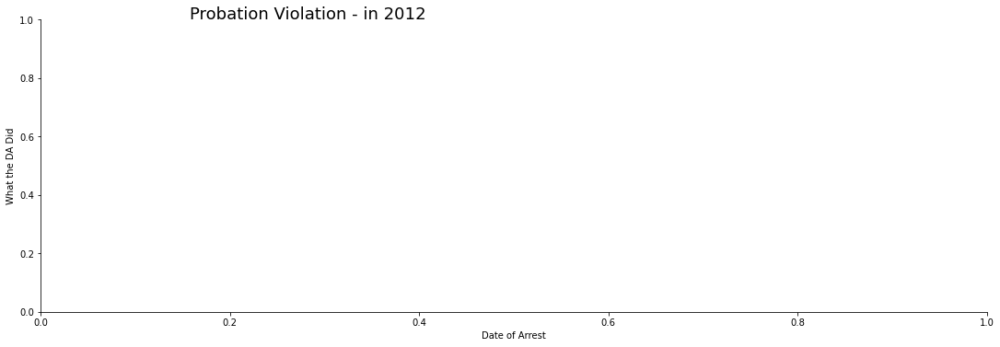

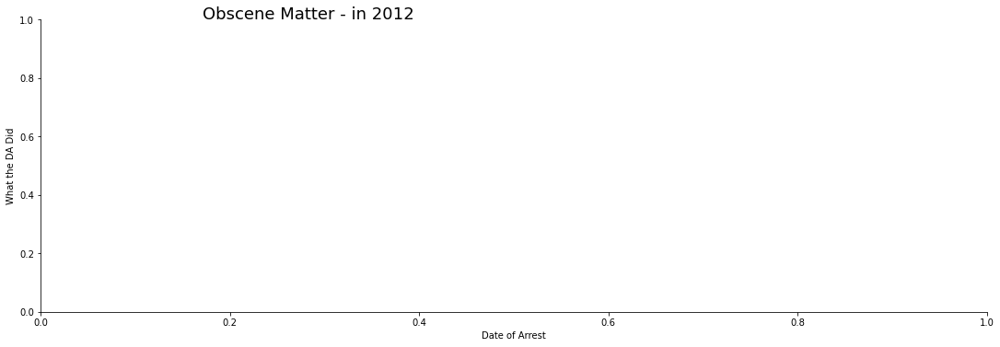

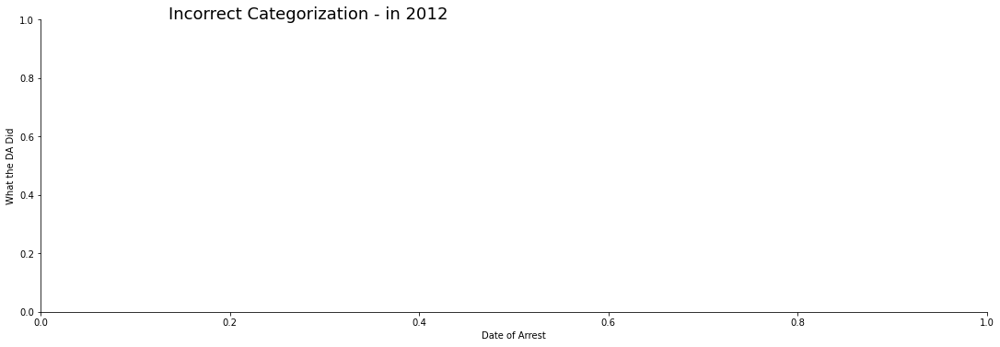

In [14]:
for i in df.crime_type.value_counts().index:
    crime = i #'Motor Vehicle Theft'
    # date_range = ['2011' , '2013']
    year = 2012

    sns.relplot(data=df[(df.crime_type == crime) & (df.year == year)],# & (df.arrest_date > date_range[0]) & (df.arrest_date < date_range[1])],
                x= 'arrest_date',
                y= 'da_action_taken',
                # col= 'year',
                # col_wrap=1,
                row= 'booked_case_type',
                # row= 'da_action_taken',
                height= 5,
                aspect= 3,
                )
    plt.suptitle(f'{crime} - in {year}', y=1, x=0.3, fontsize=18)
    
    plt.xlabel('Date of Arrest')
    plt.ylabel('What the DA Did')
    
    plt.show()
    
    print('\n\n\n')

In [15]:
crime_type_obs = pd.DataFrame(columns={'crime_type', 'dates', 'observations'})

In [16]:
crime_type_obs = pd.read_csv('crime_type_obs.csv')
crime_type_obs

,Unnamed: 0,dates,crime_type,observations
0,0,"['2011', '2022']",Crazy stuff,being bad
1,1,"['2011', '2022']",Assault,"There was only 1 Misdemeanor Assault case, and..."
2,2,"['2011', '2022']",Narcotics,DA stopped requesting further investigation on...
3,3,"['2011', '2022']",Burglary,Burglary looks like it is discharged more ofte...
4,4,"['2011', '2022']",DUI,Most of the time Misd DUIs are discharged with...
5,5,"['2011', '2022']",Assault and Battery,most Ass&Bat charges are Felony with most bein...
6,6,"['2011', '2022']",Theft,All but 5 Theft cases are Felony with a simila...
7,7,"['2011', '2022']",Robbery,ALL Robbery is Felony in SF and most get disch...
8,8,"['2011', '2022']",Weapons,Weapons charges are mostly Felony with a BIG d...
9,9,"['2011', '2022']",Motor Vehicle Theft,Stealing cars is always a Felony. And is most ...


In [17]:
# crime_type_obs.loc[len(crime_type_obs)] = ['being bad', 'Crazy stuff', ['2011', '2022']]
# crime_type_obs

In [18]:
# This is the relplot for a range in dates. 
# Rows show Felony or Misdemeanor.
# And each Crime Type is the suptitle for each pair of plots
# Set the dat_range to the years you want included in the plots

# We will 

# for i in df.crime_type.value_counts().index:
#     crime = i #'Motor Vehicle Theft'
#     date_range = ['2011' , '2022']
#     # year = 2012       (df.year == year)],

#     sns.relplot(data=df[(df.crime_type == crime) & (df.arrest_date >= date_range[0]) & (df.arrest_date <= date_range[1])],
#                 x= 'arrest_date',
#                 y= 'da_action_taken',
#                 # col= 'year',
#                 # col_wrap=1,
#                 row= 'booked_case_type',
#                 # row= 'da_action_taken',
#                 height= 5,
#                 aspect= 3,
#                 )
#     plt.suptitle(f'{crime} - in {date_range[0]}-{date_range[1]}', y=1, x=0.3, fontsize=18)
    
#     plt.xlabel('Date of Arrest')
#     plt.ylabel('What the DA Did')
    
#     plt.show()
    
#     print('\n\n\n')
    
#     obs = input('Observations...?  : ')
#     print('\n\n', obs, '\n\n\n')
    
#     crime_type_obs.loc[len(crime_type_obs)] = [i, obs, date_range]

In [19]:
crime_type_obs

,Unnamed: 0,dates,crime_type,observations
0,0,"['2011', '2022']",Crazy stuff,being bad
1,1,"['2011', '2022']",Assault,"There was only 1 Misdemeanor Assault case, and..."
2,2,"['2011', '2022']",Narcotics,DA stopped requesting further investigation on...
3,3,"['2011', '2022']",Burglary,Burglary looks like it is discharged more ofte...
4,4,"['2011', '2022']",DUI,Most of the time Misd DUIs are discharged with...
5,5,"['2011', '2022']",Assault and Battery,most Ass&Bat charges are Felony with most bein...
6,6,"['2011', '2022']",Theft,All but 5 Theft cases are Felony with a simila...
7,7,"['2011', '2022']",Robbery,ALL Robbery is Felony in SF and most get disch...
8,8,"['2011', '2022']",Weapons,Weapons charges are mostly Felony with a BIG d...
9,9,"['2011', '2022']",Motor Vehicle Theft,Stealing cars is always a Felony. And is most ...


In [20]:
df.crime_type.value_counts().index

Index(['Assault', 'Narcotics', 'Other', 'Burglary', 'DUI',
       'Assault and Battery', 'Theft', 'Robbery', 'Weapons',
       'Motor Vehicle Theft', 'Petty Theft', 'Trespassing', 'Selected Traffic',
       'Marijauana', 'Other Sex Law Violations', 'Prostitution',
       'Willful Homicide (Att.)', 'Forgery, Checks, Access Cards',
       'Forcible Rape', 'Arson', 'Kidnapping', 'NA (Att.)', 'Willful Homicide',
       'Hit-and-Run', 'Other Theft', 'Vandalism', 'Local SF Ordinance',
       'Disorderly Conduct', 'Indecent Exposure', 'Liquor Laws',
       'Malicious Mischief', 'Lewd Conduct', 'Disturbing Peace',
       'Manslaughter - Vehicular', 'Lewd or Lascivious', 'Escape',
       'Unlawful Sexual Intercourse', 'Manslaughter - Non Vehicular',
       'Annoy/Molest Children', 'Enhancements',
       'Faiulre to Appear/Non-Traffic', 'Contributing Delinquency of Minor',
       'Gambling', 'Probation Violation', 'Obscene Matter',
       'Incorrect Categorization'],
      dtype='object')

In [21]:
df.crime_type.value_counts()

Assault                              25797
Narcotics                            18981
Other                                14000
Burglary                             13300
DUI                                  11824
Assault and Battery                  11152
Theft                                 7375
Robbery                               6892
Weapons                               5559
Motor Vehicle Theft                   5360
Petty Theft                           2041
Trespassing                           1740
Selected Traffic                      1414
Marijauana                            1403
Other Sex Law Violations              1021
Prostitution                           796
Willful Homicide (Att.)                733
Forgery, Checks, Access Cards          624
Forcible Rape                          615
Arson                                  592
Kidnapping                             560
NA (Att.)                              488
Willful Homicide                       456
Hit-and-Run

In [22]:
# df[df.crime_type == ['Assault' | 'Narcotics' | 'Other' | 'Burglary' | 'DUI' | 'Assault and Battery' | 'Theft' | 'Robbery']]

In [23]:
# df[df.crime_type == 'Assault' | 'Narcotics' | 'Other' | 'Burglary' | 'DUI' | 'Assault and Battery' | 'Theft' | 'Robbery']

In [24]:
trying_df = df[(df.crime_type == 'Assault') | (df.crime_type == 'Narcotics') | (df.crime_type == 'Burglary')\
   | (df.crime_type == 'DUI') | (df.crime_type == 'Assault and Battery') | (df.crime_type == 'Theft') | (df.crime_type == 'Robbery')]

In [25]:
trying_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95321 entries, 1713 to 134675
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   court_number      95321 non-null  int64         
 1   arrest_date       95321 non-null  datetime64[ns]
 2   arresting_agency  95321 non-null  object        
 3   crime_type        95321 non-null  object        
 4   booked_case_type  95321 non-null  object        
 5   dv_case           95321 non-null  object        
 6   da_action_taken   95321 non-null  category      
 7   year              95321 non-null  int64         
 8   month             95321 non-null  int64         
 9   weekend           95321 non-null  int64         
dtypes: category(1), datetime64[ns](1), int64(4), object(4)
memory usage: 7.4+ MB


In [26]:
# trying_df.da_action_taken.unique()

In [27]:
trying_df = trying_df.drop(index=trying_df[trying_df.da_action_taken == 'Other Action'].index)

In [28]:
# trying_df.da_action_taken.unique()

In [29]:
mtr_folks = trying_df[trying_df.da_action_taken == 'MTR/Referred to Other Agency']

In [30]:
# trying_df.drop(index=mtr_folks.index)

In [31]:
trying_df = trying_df.drop(index=mtr_folks.index)

In [32]:
trying_df.dv_case.value_counts()

No     67296
Yes    13184
Name: dv_case, dtype: int64

In [33]:
trying_df.crime_type[trying_df.dv_case == 'Yes'].value_counts()

Assault                9098
Assault and Battery    3519
Robbery                 424
Burglary                 70
Theft                    36
Narcotics                34
DUI                       3
Name: crime_type, dtype: int64

In [34]:
trying_df.da_action_taken.value_counts()

Charges Filed                      45907
Discharged                         29905
Further Investigation Requested     4668
MTR/Referred to Other Agency           0
Other Action                           0
Name: da_action_taken, dtype: int64

In [35]:
# trying_df[trying_df.da_action_taken == 'Further Investigation Requested']

In [36]:
# trying_df.drop(index=trying_df[trying_df.da_action_taken == 'Further Investigation Requested'].index)

In [37]:
trying_df = trying_df.drop(index=trying_df[trying_df.da_action_taken == 'Further Investigation Requested'].index)

In [38]:
# for i in trying_df:
#     print(trying_df[i].value_counts())

In [39]:
df.year.value_counts()/ trying_df.year.value_counts()

2011    1.710995
2012    1.732848
2013    1.774819
2014    1.833170
2015    1.879302
2016    1.836218
2017    1.778087
2018    1.786291
2019    1.795787
2020    1.956887
2021    1.725629
2022    1.627518
Name: year, dtype: float64

In [40]:
trying_df[trying_df.arresting_agency == 'BART'].da_action_taken.value_counts()

Discharged                         388
Charges Filed                      228
Further Investigation Requested      0
MTR/Referred to Other Agency         0
Other Action                         0
Name: da_action_taken, dtype: int64

In [41]:
df = trying_df.reset_index(drop=True)

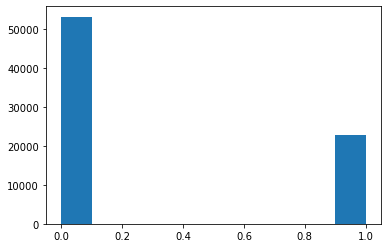

In [42]:
plt.hist(x= df.weekend)
plt.show()

In [43]:
# from viz import hists

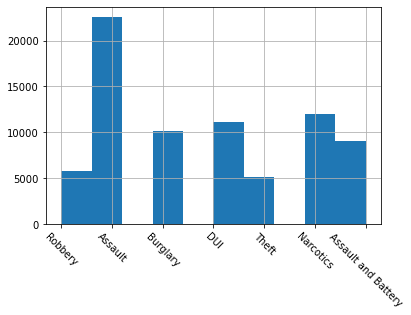

In [44]:
df.crime_type.hist()

plt.xticks(rotation= -45)
plt.show()

In [45]:
df.da_action_taken = df.da_action_taken.cat.set_categories(['Charges Filed', 'Discharged'], ordered=True)

In [46]:
# for i in df.crime_type.unique():
#     plt.hist(data=df[df.crime_type == i],
#              x= 'da_action_taken')
    
#     plt.title(f'{i}')
#     plt.show()

In [47]:
# for i in df.crime_type.unique():
#     sns.stripplot(data=df[df.crime_type == i],
#              y= 'da_action_taken',
#                  x= 'year')
    
#     plt.title(f'{i}')
#     plt.show()

In [48]:
df.columns

Index(['court_number', 'arrest_date', 'arresting_agency', 'crime_type',
       'booked_case_type', 'dv_case', 'da_action_taken', 'year', 'month',
       'weekend'],
      dtype='object')

In [49]:
# for i in df[['arresting_agency', 'crime_type', 'booked_case_type', 'dv_case', 'year', 'month', 'weekend']]:
#     for j in df[i].unique():
#         plt.hist(data= df[df[i] == j],
#                  x= 'da_action_taken')
#         plt.title(f'When {i} is {j}')
        
#         plt.show()

In [50]:
df = df.reset_index(drop=True)

In [51]:
# low_court = df[df.court_number < 4_000_000]

In [52]:
# for i in low_court[['arresting_agency', 'crime_type', 'booked_case_type', 'dv_case', 'year', 'month', 'weekend']]:
#     for j in low_court[i].unique():
#         plt.hist(data= low_court[low_court[i] == j],
#                  x= 'da_action_taken')
#         plt.title(f'When {i} is {j}')
        
#         plt.show()

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75812 entries, 0 to 75811
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   court_number      75812 non-null  int64         
 1   arrest_date       75812 non-null  datetime64[ns]
 2   arresting_agency  75812 non-null  object        
 3   crime_type        75812 non-null  object        
 4   booked_case_type  75812 non-null  object        
 5   dv_case           75812 non-null  object        
 6   da_action_taken   75812 non-null  category      
 7   year              75812 non-null  int64         
 8   month             75812 non-null  int64         
 9   weekend           75812 non-null  int64         
dtypes: category(1), datetime64[ns](1), int64(4), object(4)
memory usage: 5.3+ MB


In [54]:
# high_court = df[df.court_number > 4_000_000]

In [55]:
# for i in high_court[['arresting_agency', 'crime_type', 'booked_case_type', 'dv_case', 'year', 'month', 'weekend']]:
#     for j in high_court[i].unique():
#         plt.hist(data= high_court[high_court[i] == j],
#                  x= 'da_action_taken')
#         plt.title(f'When {i} is {j}')
        
#         plt.show()

In [56]:
# bins = pd.IntervalIndex.from_tuples([(0, 4_000_000), (4_000_000, 40_000_000)])

df['low_high_court_num'] = pd.cut(df.court_number, bins= (0, 4_000_000, 40_000_000), labels= ['low', 'high'])

In [57]:
# df.low_high_court_num

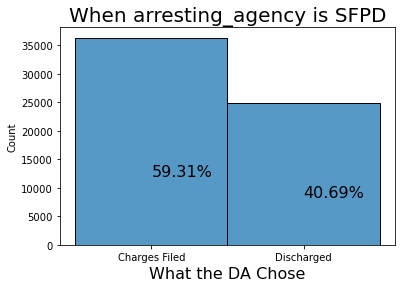

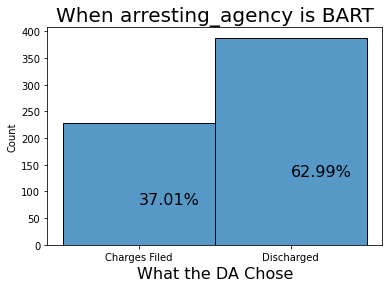

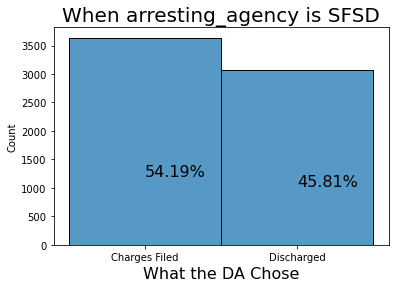

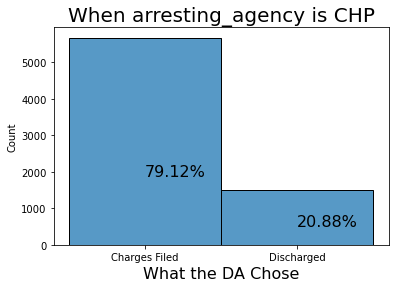

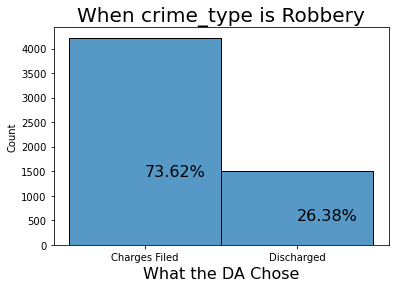

...

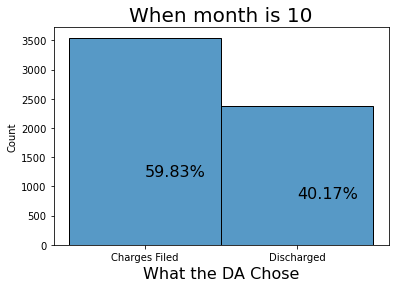

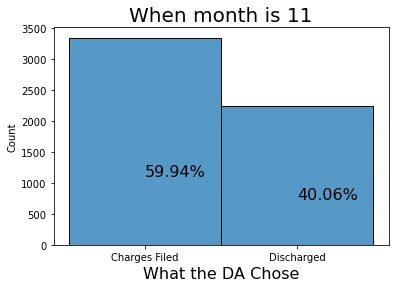

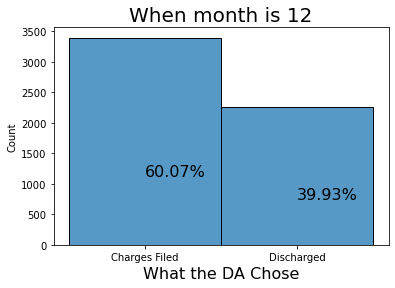

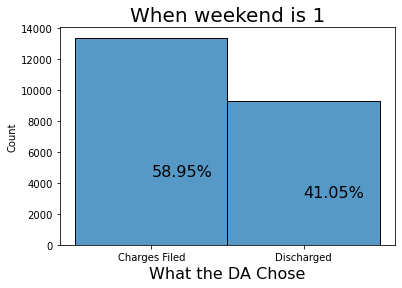

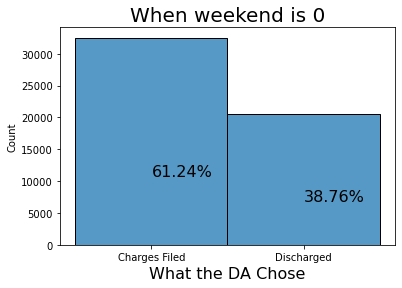

In [58]:
this_font = {'fontsize': 16}

for i in df[['arresting_agency', 'crime_type', 'booked_case_type', 'dv_case', 'year', 'month', 'weekend']]:
    for j in df[i].unique():
        sns.histplot(data= df[df[i] == j],
                 x= 'da_action_taken',
                    # col='low_high_court_num'
                    )
        plt.title(f'When {i} is {j}', fontdict= {'fontsize': 20})
              
        num_arrest = df.da_action_taken[df[i] == j].count()
        num_charged = df.da_action_taken[(df[i] == j) & (df.da_action_taken == 'Charges Filed')].count()
        num_discharged = df.da_action_taken[(df[i] == j) & (df.da_action_taken == 'Discharged')].count()
        
        # if num_charged > 
        # y_max = 
        
        plt.text(x= 'Charges Filed', y= num_charged / 3, s=f'{percent(num_charged / num_arrest)}', fontdict= this_font)
        plt.text(x= 'Discharged', y= num_discharged / 3, s=f'{percent(num_discharged / num_arrest)}', fontdict= this_font)
        
        plt.xlabel('What the DA Chose', fontdict= this_font)
        
        plt.show()

In [59]:
# this_font = {'fontsize': 16}

# for i in df[['arresting_agency', 'crime_type', 'booked_case_type', 'dv_case', 'year', 'month', 'weekend']]:
#     for j in df[i].unique():
#         sns.histplot(data= df[df[i] == j],
#                  x= 'da_action_taken',
#                     # col='low_high_court_num'
#                     )
#         plt.title(f'When {i} is {j}', fontdict= {'fontsize': 20})
              
#         num_arrest = df.da_action_taken[df[i] == j].count()
#         num_charged = df.da_action_taken[(df[i] == j) & (df.da_action_taken == 'Charges Filed')].count()
#         num_discharged = df.da_action_taken[(df[i] == j) & (df.da_action_taken == 'Discharged')].count()
        
#         # if num_charged > 
#         # y_max = 
        
#         plt.text(x= 'Charges Filed', y= num_charged / 3, s=f'{Percent(num_charged / num_arrest)}', fontdict= this_font)
#         plt.text(x= 'Discharged', y= num_discharged / 3, s=f'{Percent(num_discharged / num_arrest)}', fontdict= this_font)
        
#         plt.xlabel('What the DA Chose', fontdict= this_font)
        
#         plt.show()

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75812 entries, 0 to 75811
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   court_number        75812 non-null  int64         
 1   arrest_date         75812 non-null  datetime64[ns]
 2   arresting_agency    75812 non-null  object        
 3   crime_type          75812 non-null  object        
 4   booked_case_type    75812 non-null  object        
 5   dv_case             75812 non-null  object        
 6   da_action_taken     75812 non-null  category      
 7   year                75812 non-null  int64         
 8   month               75812 non-null  int64         
 9   weekend             75812 non-null  int64         
 10  low_high_court_num  75812 non-null  category      
dtypes: category(2), datetime64[ns](1), int64(4), object(4)
memory usage: 5.4+ MB


In [61]:
df.columns

Index(['court_number', 'arrest_date', 'arresting_agency', 'crime_type',
       'booked_case_type', 'dv_case', 'da_action_taken', 'year', 'month',
       'weekend', 'low_high_court_num'],
      dtype='object')

In [62]:
drop_list = df.columns.to_list()

In [63]:
type(drop_list)

list

In [64]:
for i in ['arresting_agency', 'crime_type', 'booked_case_type', 'dv_case', 'da_action_taken', 
                 'year']:
    drop_list.remove(i)

In [65]:
drop_list

['court_number', 'arrest_date', 'month', 'weekend', 'low_high_court_num']

In [66]:
df = df.drop(columns= drop_list)

In [67]:
df.columns = ['arresting_agency',
 'crime_type',
 'booked_case_type',
 'domestic_violence',
 'da_action_taken',
 'year']

In [68]:
from exploration import split_data

In [69]:
train, validate, test = split_data(df, strat_by='da_action_taken')

Prepared df: (75812, 6)

Train: (45486, 6)
Validate: (15163, 6)
Test: (15163, 6)


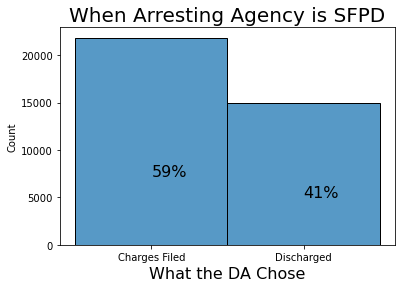

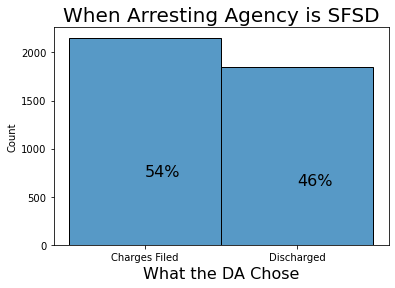

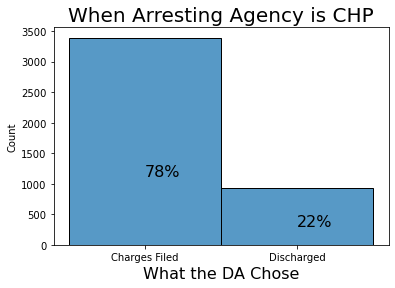

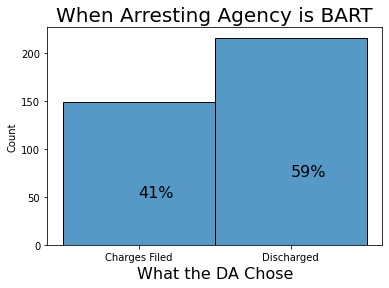

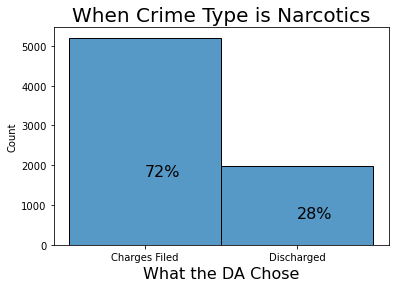

...

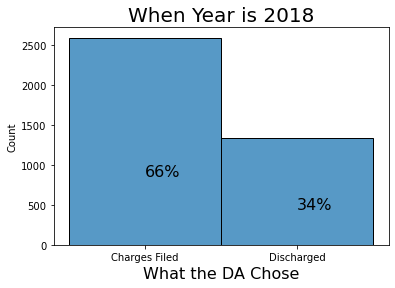

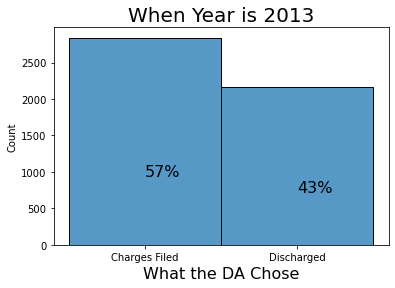

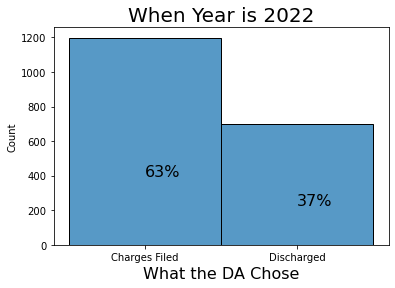

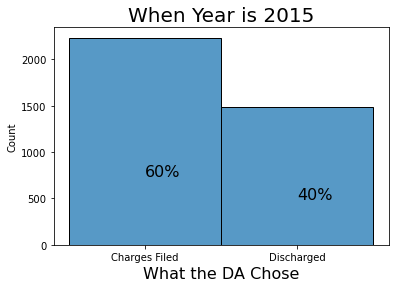

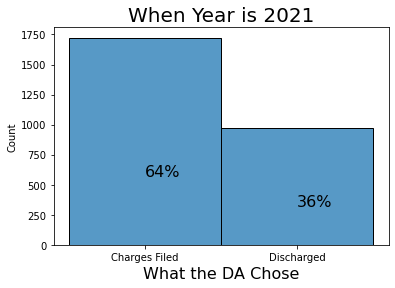

In [70]:
this_font = {'fontsize': 16}

for i in train[['arresting_agency', 'crime_type', 'booked_case_type', 'domestic_violence', 'year']]:
    for j in train[i].unique():
        sns.histplot(data= train[train[i] == j],
                 x= 'da_action_taken',
                    # col='low_high_court_num'
                    )
        # k = i.split('_')
        # l = ''
        # for m in k:
        #     l += m.capitalize()
        #     l += ' '
        # l = l.strip()
        
        plt.title(f'When {col_cap(i)} is {j}', fontdict= {'fontsize': 20})
              
        num_arrest = train.da_action_taken[train[i] == j].count()
        num_charged = train.da_action_taken[(train[i] == j) & (train.da_action_taken == 'Charges Filed')].count()
        num_discharged = train.da_action_taken[(train[i] == j) & (train.da_action_taken == 'Discharged')].count()
        
        # if num_charged > 
        # y_max = 
        
        
        
        plt.text(x= 'Charges Filed', y= num_charged / 3, s=f'{Percent(num_charged / num_arrest)}', fontdict= this_font)
        plt.text(x= 'Discharged', y= num_discharged / 3, s=f'{Percent(num_discharged / num_arrest)}', fontdict= this_font)
        
        plt.xlabel('What the DA Chose', fontdict= this_font)
        
        plt.show()

In [71]:
train

,arresting_agency,crime_type,booked_case_type,domestic_violence,da_action_taken,year
54412,SFPD,Narcotics,Felony,No,Charges Filed,2016
74769,SFPD,Narcotics,Misd Arrest,No,Charges Filed,2019
19219,SFPD,Assault,Felony,No,Charges Filed,2012
60304,SFPD,Assault and Battery,Misd Arrest,No,Discharged,2019
1672,SFPD,Robbery,Felony,No,Charges Filed,2011
...,...,...,...,...,...,...
55505,SFPD,Assault and Battery,Misd Arrest,No,Discharged,2011
10797,SFPD,Assault,Felony,Yes,Discharged,2015
29013,SFPD,Burglary,Felony,No,Discharged,2013
44549,SFPD,Narcotics,Felony,No,Discharged,2012


In [72]:
# my_string = 'art_is_cool'

# new_string = my_string.split('_')

# j=''
# for i in new_string:
#     j += i.capitalize()
#     j += ' '
    
# j = j.strip()

# j

In [73]:
for i in train:
    print(train[i].value_counts())

SFPD    36789
CHP      4328
SFSD     4004
BART      365
Name: arresting_agency, dtype: int64
Assault                13446
Narcotics               7192
DUI                     6720
Burglary                6056
Assault and Battery     5458
Robbery                 3464
Theft                   3150
Name: crime_type, dtype: int64
Felony         33224
Misd Arrest    12262
Name: booked_case_type, dtype: int64
No     37761
Yes     7725
Name: domestic_violence, dtype: int64
Charges Filed    27543
Discharged       17943
Name: da_action_taken, dtype: int64
2011    5206
2013    5005
2012    4796
2014    4254
2018    3927
2019    3828
2016    3803
2015    3718
2017    3693
2021    2691
2020    2671
2022    1894
Name: year, dtype: int64
